In [39]:
import xarray as xr
import pyorc
import cartopy
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

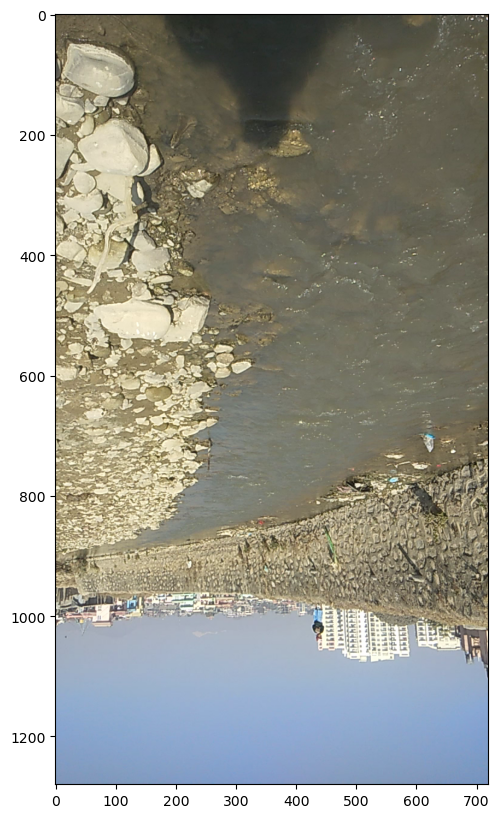

In [40]:
video_file = "/Users/Rajneesh/Downloads/nakkhusecond.mp4"
video = pyorc.Video(video_file, start_frame=0, end_frame=1)  # we only need one frame
frame = video.get_frame(0, method="rgb")

# plot frame on a notebook-style window
f = plt.figure(figsize=(10, 10))
plt.imshow(frame)

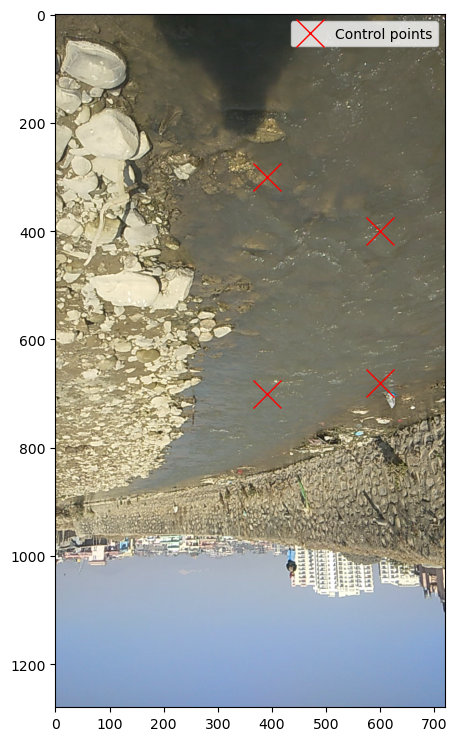

In [41]:
gcps = dict(
    src=[
            
          [390,300],
          [390,700],
          [600,680],
          [600,400]
        
        
    ]
)

f = plt.figure(figsize=(16, 9))
plt.imshow(frame)
plt.plot(*zip(*gcps["src"]), "rx", markersize=20, label="Control points")
plt.legend()

In [43]:
gcps["dst"] = [
    
    # [333064.995,	3060800.482],
    # [333065.563	,3060788.395],
    # [333075.091	,3060788.324],
    # [333075.944	,3060800.624],
    
    # [333037.181,3060597.369],	
    # [333036.383,3060593.556],		
    # [333038.068,3060593.237],		
    # [333038.937,3060597.139],		
    
    # [333037.181,3060597.378],		
    # [333036.276,3060593.582],		
    # [333038.015,3060593.121],		
    # [333038.902,3060596.988],
    
        # [333040.108,3060614.782],	
        # [333040.256,3060608.852],	
        # [333043.036,3060608.838],	
        # [333042.814,3060614.738],
        
        [333039.576,3060593.089],
        [333040.404,3060598.354],
        [333037.92,3060598.827],
        [333036.914,3060593.681]
    
]


# # if we would use this video as survey in video, the lines below are also needed,
# # and proper values need to be filled in. They are now commented out.
# gcps["h_ref"] = <your locally measured water level during survey in>
gcps["z_0"] = 1286

# set the height and width
height, width = frame.shape[0:2]

# now we use everything to make a camera configuration
cam_config = pyorc.CameraConfig(height=height, width=width, gcps=gcps, crs=32645)

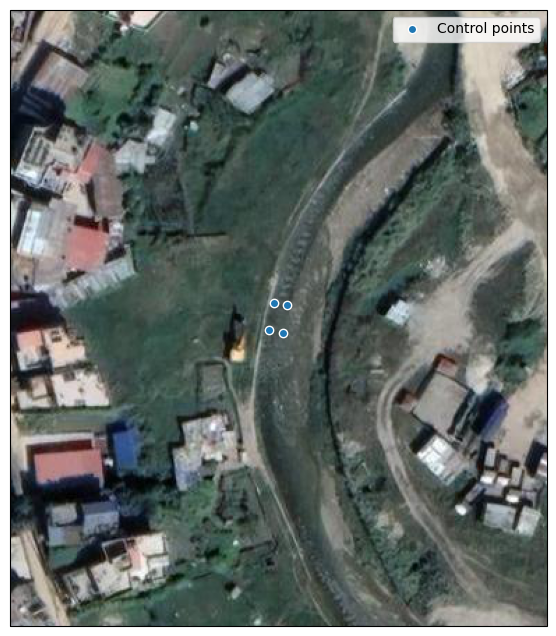

In [44]:
ax = cam_config.plot(tiles="GoogleTiles", tiles_kwargs={"style": "satellite"})

In [45]:
corners = [
    
          [360,250],
          [360,780],
          [600,700],
          [600,350]

]
cam_config.set_bbox_from_corners(corners)
cam_config.resolution = 0.01
cam_config.window_size = 25

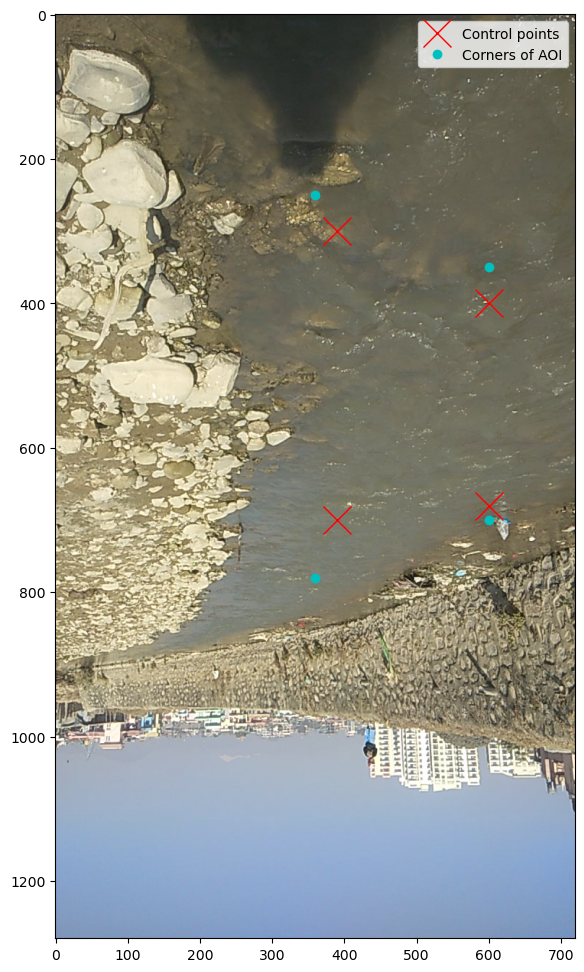

In [46]:
f = plt.figure(figsize=(10, 12))
plt.imshow(frame)
plt.plot(*zip(*gcps["src"]), "rx", markersize=20, label="Control points")
plt.plot(*zip(*corners), "co", label="Corners of AOI")
plt.legend()

<AxesSubplot: >

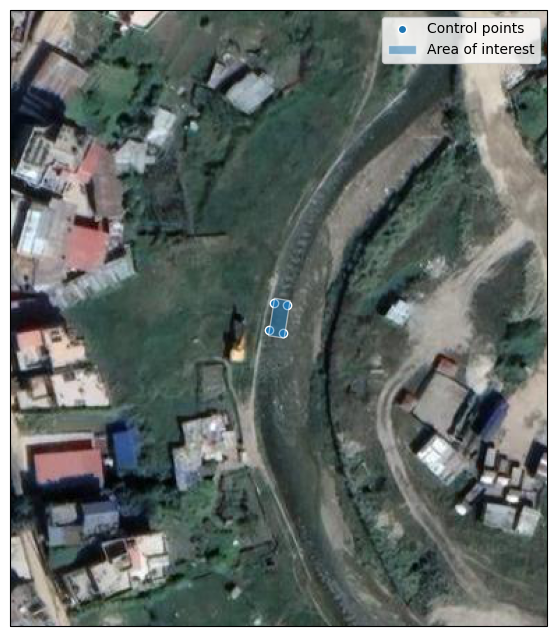

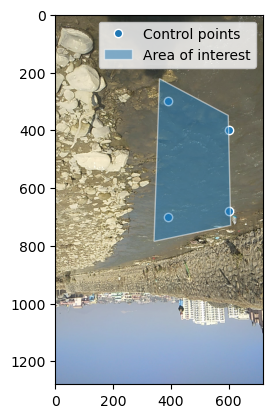

In [47]:
ax1 = cam_config.plot(tiles="GoogleTiles", tiles_kwargs={"style": "satellite"})

f = plt.figure()
ax2 = plt.axes()
ax2.imshow(frame)
cam_config.plot(ax=ax2, camera=True)

In [48]:
cam_config.to_file("nakkhusecond.json")

In [49]:
import pyorc
import matplotlib.pyplot as plt
import xarray as xr
import cartopy
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from dask.diagnostics import ProgressBar

In [50]:
cam_config = pyorc.load_camera_config("/Users/Rajneesh/Downloads/PythonOpenRiverCam/nakkhusecond.json")
video_file = "/Users/Rajneesh/Downloads/nakkhusecond.mp4"
video = pyorc.Video(video_file, camera_config=cam_config, start_frame=0, end_frame=125, stabilize="fixed")

Stabilizing frames: 100%|██████████| 124/124 [00:03<00:00, 32.56it/s]


In [51]:
da = video.get_frames()

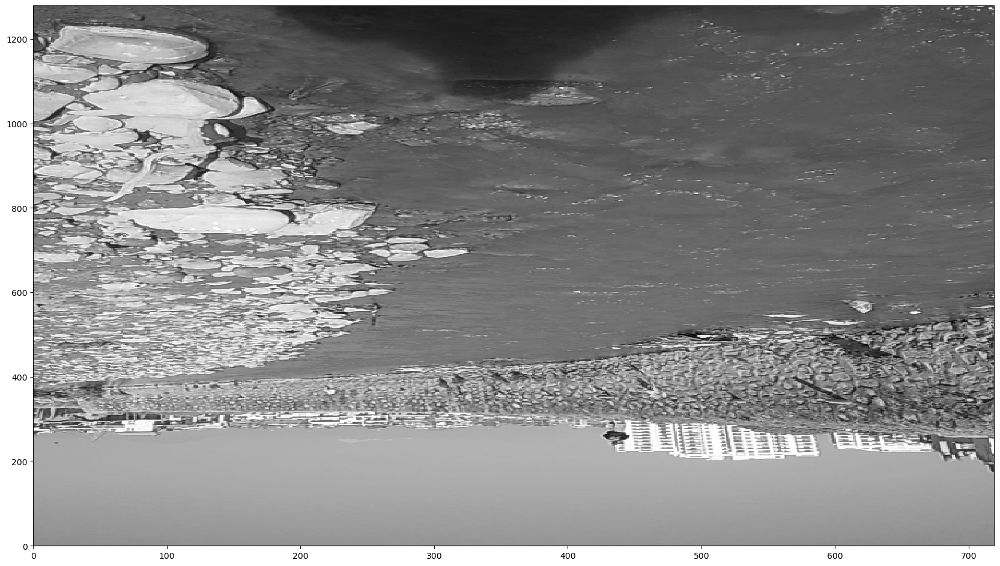

In [52]:
da[0].frames.plot(cmap="gray")

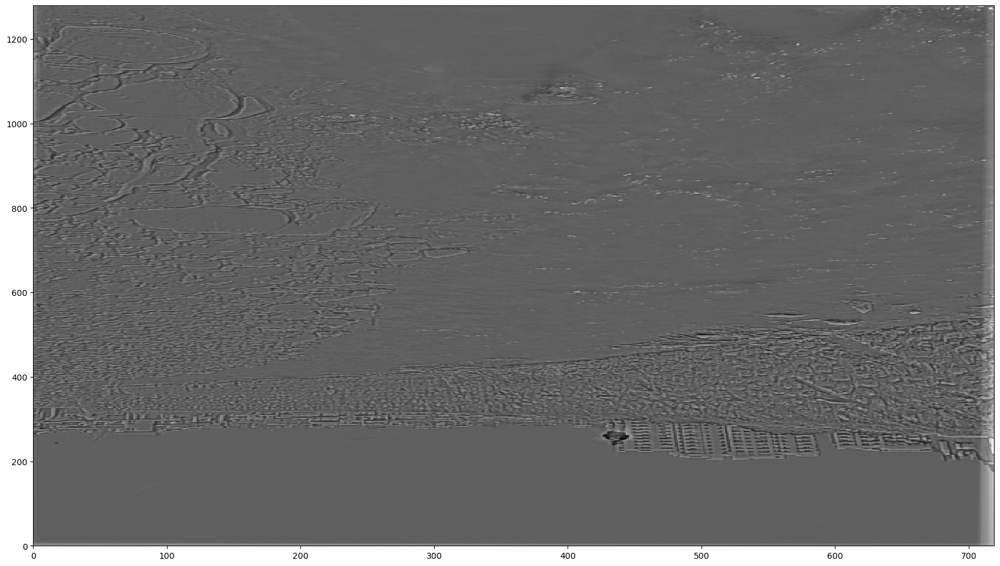

In [15]:
da_norm = da.frames.normalize()
da_norm[0].frames.plot(cmap="gray")

<Figure size 1600x900 with 0 Axes>

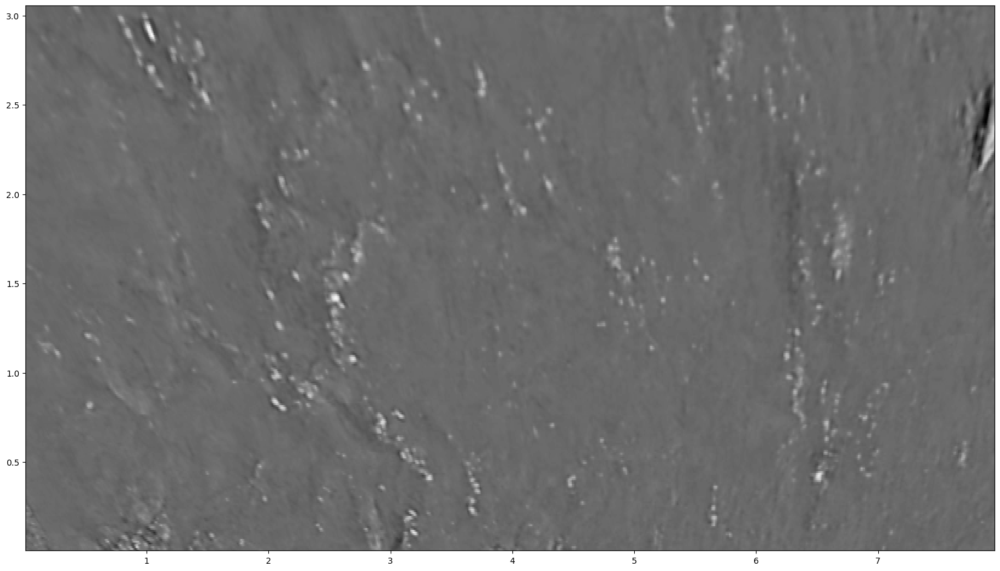

In [53]:
f = plt.figure(figsize=(16, 9))
da_norm_proj = da_norm.frames.project()
da_norm_proj[0].frames.plot(cmap="gray")

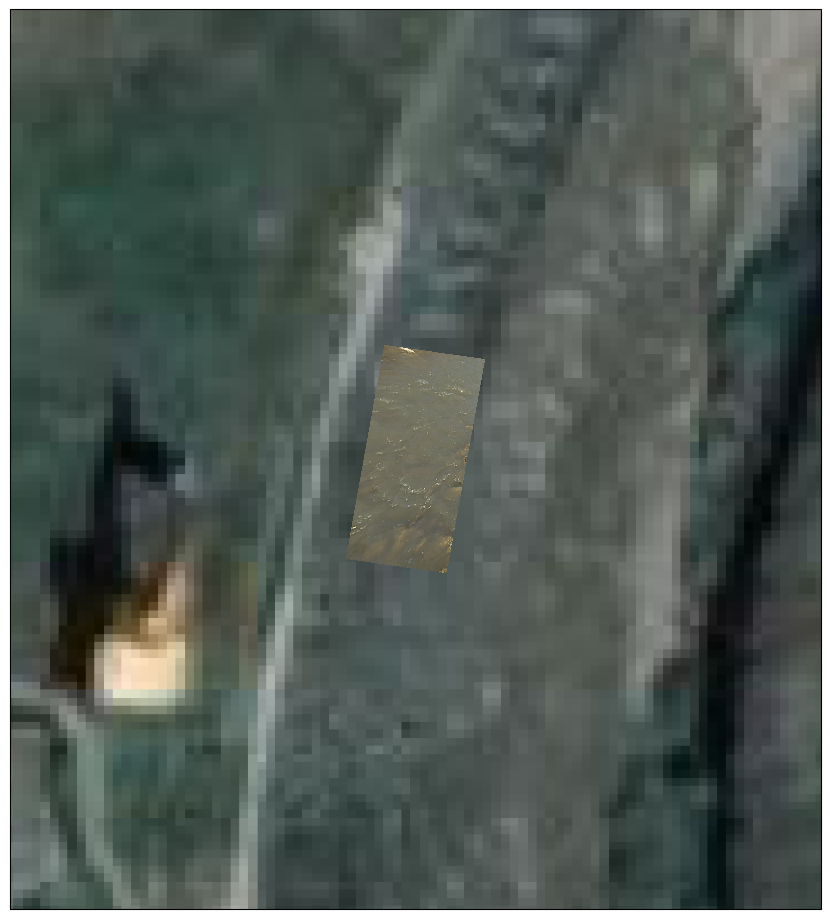

In [54]:
da_rgb = video.get_frames(method="rgb")
# project the rgb frames, same as before
da_rgb_proj = da_rgb.frames.project()
# plot the first frame in geographical mode
p = da_rgb_proj[0].frames.plot(mode="geographical")

# for fun, let's also add a satellite background from cartopy
import cartopy.io.img_tiles as cimgt
import cartopy.crs as ccrs
tiles = cimgt.GoogleTiles(style="satellite")
p.axes.add_image(tiles, 19)
# zoom out a little bit so that we can actually see a bit
p.axes.set_extent([
    da_rgb_proj.lon.min() - 0.0001,
    da_rgb_proj.lon.max() + 0.0001,
    da_rgb_proj.lat.min() - 0.0001,
    da_rgb_proj.lat.max() + 0.0001],
    crs=ccrs.PlateCarree()
)

In [55]:
piv = da_norm_proj.frames.get_piv()
delayed_obj = piv.to_netcdf("nakkhusecond.nc", compute=False)
with ProgressBar():
    results = delayed_obj.compute()

[########################################] | 100% Completed | 70.19 s


In [56]:
ds = xr.open_dataset("/Users/Rajneesh/Downloads/PythonOpenRiverCam/nakkhusecond.nc")

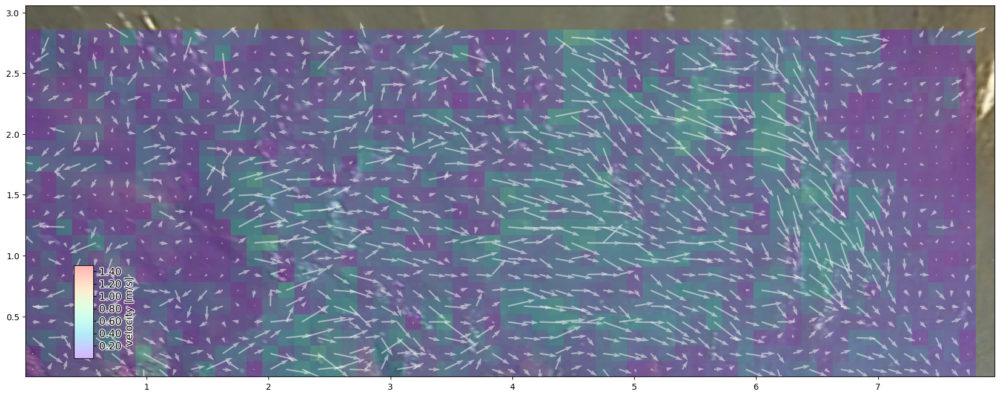

In [57]:
video_file = "/Users/Rajneesh/Downloads/nakkhusecond.mp4"

video = pyorc.Video(video_file, start_frame=0, end_frame=125)
# borrow the camera config from the velocimetry results
video.camera_config = ds.velocimetry.camera_config

da_rgb = video.get_frames(method="rgb")
# project the rgb frame
da_rgb_proj = da_rgb.frames.project()
# plot the first frame (we only have one) without any arguments, default is to use "local" mode
p = da_rgb_proj[0].frames.plot()

# now plot the results on top, we use the mean, because we cannot plot more than 2 dimensions.
# Default plotting method is "quiver", but "scatter" or "pcolormesh" is also possible.
# We add a nice colorbar to understand the magnitudes.
# We give the existing axis handle of the mappable returned from .frames.plot to plot on, and use
# some transparency.
ds_mean = ds.mean(dim="time", keep_attrs=True)

# first a pcolormesh
ds_mean.velocimetry.plot.pcolormesh(
    ax=p.axes,
    alpha=0.3,
    cmap="rainbow",
    add_colorbar=True,
    vmax=1.5
)

ds_mean.velocimetry.plot(
    ax=p.axes,
    color="w",
    alpha=0.5,
    width=0.0015,
    
)

In [58]:
from matplotlib.colors import Normalize

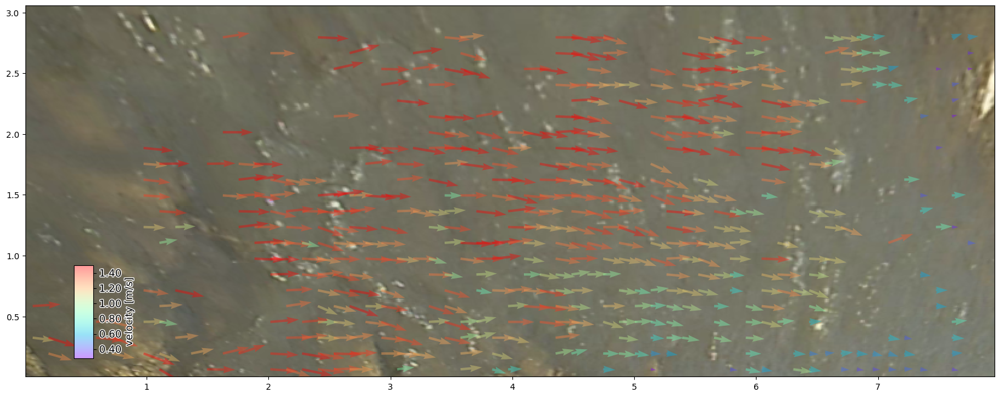

In [59]:
# simply apply all filters in time domain, this is done by calling .filter_temporal without arguments.
ds_filt = ds.velocimetry.filter_temporal()

# apply the plot again, let's leave out the scalar values, and make the quivers a bit nicer than before.
ds_mean_filt = ds_filt.mean(dim="time", keep_attrs=True)


# again the rgb frame first
p = da_rgb_proj[0].frames.plot()

#...and then filtered velocimetry
ds_mean_filt.velocimetry.plot(
    ax=p.axes,
    alpha=0.4,
    cmap="rainbow",
    scale=50,
    width=0.0025,
    norm=Normalize(vmax=1.5, clip=False),
    add_colorbar=True
)

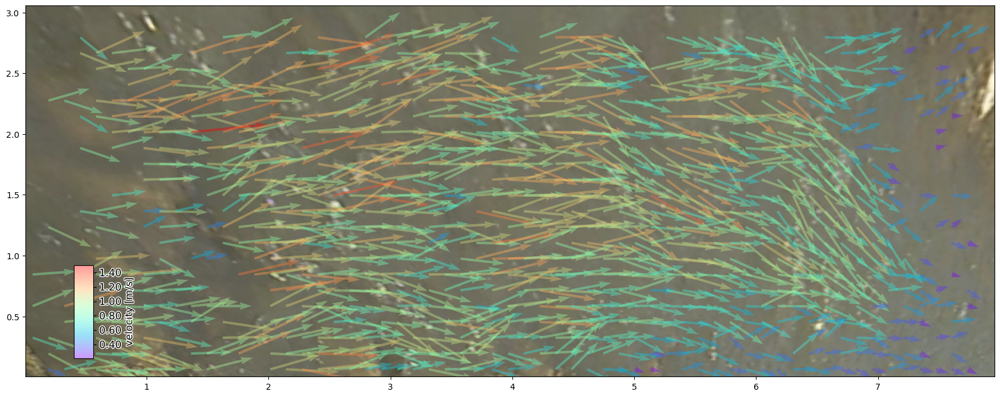

In [67]:
import numpy as np
ds_filt2 = ds.velocimetry.filter_temporal(kwargs_angle=dict(angle_tolerance=0.5*np.pi), kwargs_velocity=dict(s_max=2.))
ds_filt2.velocimetry.filter_spatial(filter_nan=False, inplace=True, kwargs_median=dict(wdw=2))
# apply the plot again, let's leave out the scalr values, and make the quivers a bit nicer than before.

ds_mean_filt2 = ds_filt2.mean(dim="time", keep_attrs=True)

# again the rgb frame first
p = da_rgb_proj[0].frames.plot()

#...and then filtered velocimetry
ds_mean_filt2.velocimetry.plot(
    ax=p.axes,
    alpha=0.4,
    cmap="rainbow",
    scale=20,
    width=0.0025,
    norm=Normalize(vmax=1.5, clip=False),
    add_colorbar=True
)

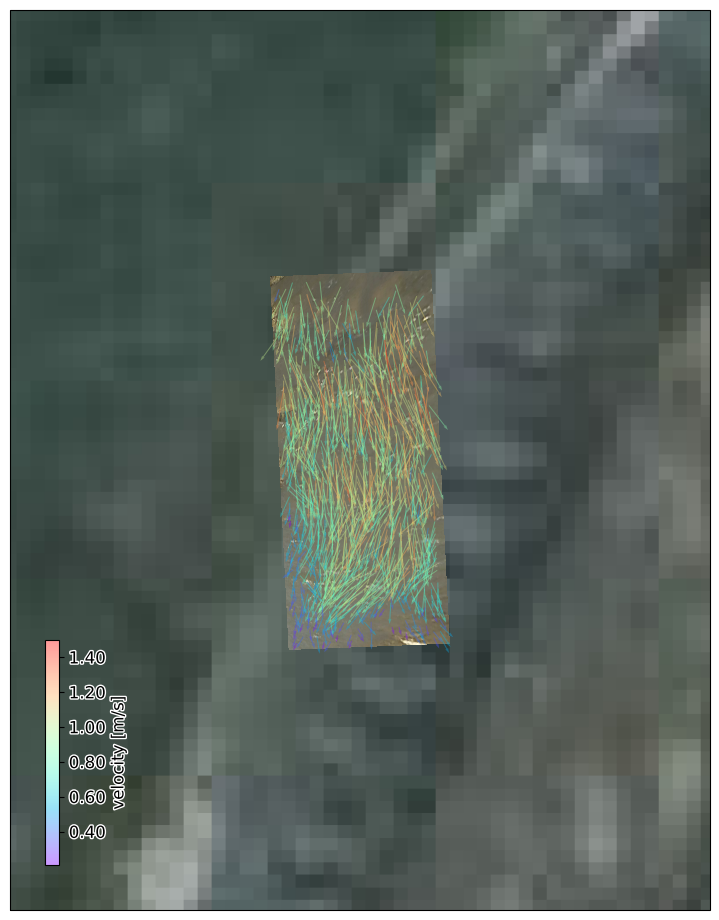

In [68]:
# again the rgb frame first. But now we use the "geographical" mode to plot on a map
p = da_rgb_proj[0].frames.plot(mode="geographical")

#...and then filtered velocimetry again, but also geographical
ds_mean_filt2.velocimetry.plot(
    ax=p.axes,
    mode="geographical",
    alpha=0.4,
    cmap="rainbow",
    scale=20,
    width=0.0015,
    norm=Normalize(vmax=1.5, clip=False),
    add_colorbar=True
)

# for fun, let's also add a satellite background from cartopy
import cartopy.io.img_tiles as cimgt
import cartopy.crs as ccrs
tiles = cimgt.GoogleTiles(style="satellite")
p.axes.add_image(tiles, 19)
# zoom out a little bit so that we can actually see a bit
p.axes.set_extent([
    da_rgb_proj.lon.min() - 0.00005,
    da_rgb_proj.lon.max() + 0.00005,
    da_rgb_proj.lat.min() - 0.00005,
    da_rgb_proj.lat.max() + 0.00005],
    crs=ccrs.PlateCarree()
)


In [63]:
import pandas as pd

In [64]:
cross_section = pd.read_csv("nakkhusecond01.csv")
x = cross_section["x"]
y = cross_section["y"]
z = cross_section["z"]
cross_section2 = pd.read_csv("nakkhusecond02.csv")
x2 = cross_section2["x"]
y2 = cross_section2["y"]
z2 = cross_section2["z"]


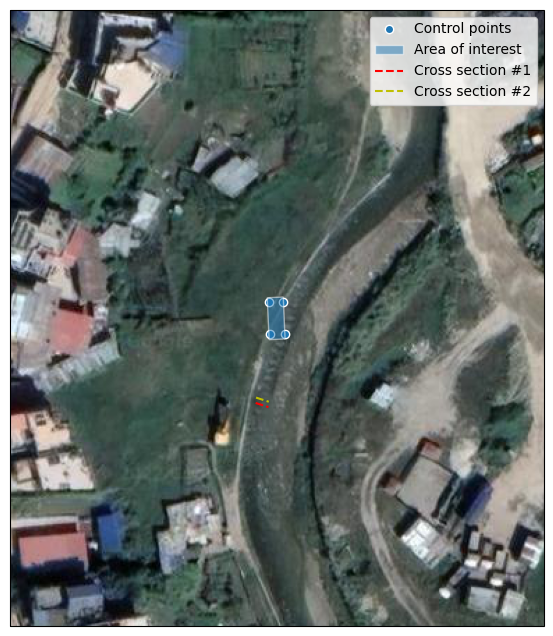

In [66]:
ax = ds.velocimetry.camera_config.plot(tiles="GoogleTiles", tiles_kwargs={"style": "satellite"},buffer=0.00005)
ax.plot(x, y, "r--", transform=ccrs.UTM(zone=45, southern_hemisphere=False), label="Cross section #1")
ax.plot(x2, y2, "y--", transform=ccrs.UTM(zone=45, southern_hemisphere=False), label="Cross section #2")
ax.legend()

In [28]:
ds_points = ds.velocimetry.get_transect(x, y, z, crs=32645, rolling=4)
ds_points2 = ds.velocimetry.get_transect(x2, y2, z2, crs=32645, rolling=4)

/Users/Rajneesh/miniconda3/envs/pyorc/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/Rajneesh/miniconda3/envs/pyorc/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


In [29]:
ds_points_q = ds_points.transect.get_q()
ds_points_q2 = ds_points2.transect.get_q()

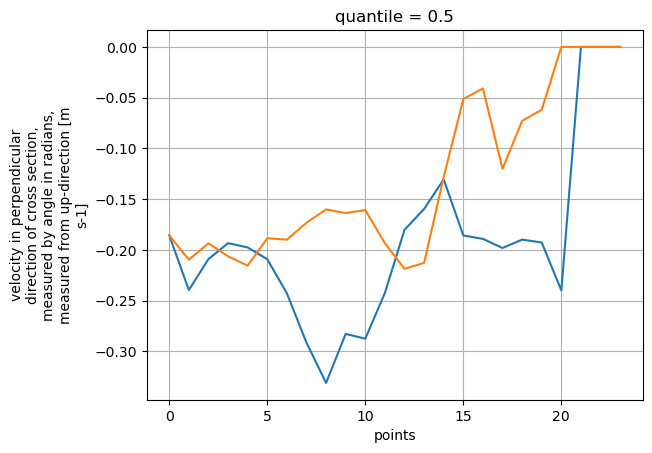

In [30]:
ax = plt.axes()
ds_points_q["v_eff"].isel(quantile=2).plot(ax=ax)
ds_points_q2["v_eff"].isel(quantile=2).plot(ax=ax)
plt.grid()

AxesSubplot(0,0;1x1)


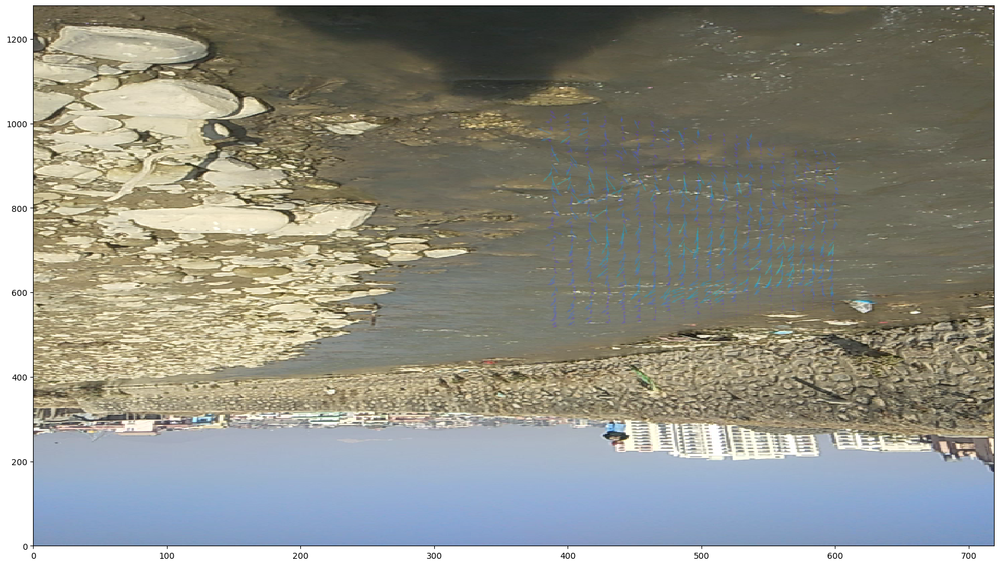

In [34]:
norm = Normalize(vmin=0., vmax=1.5, clip=False)

p = da_rgb[0].frames.plot(mode="camera")
print(p.axes)
# extract mean velocity and plot in camera projection
ds.mean(dim="time", keep_attrs=True).velocimetry.plot(
    ax=p.axes,
    mode="camera",
    cmap="rainbow",
    scale=200,
    width=0.001,
    alpha=0.3,
    norm=norm,
)



In [37]:
# plot velocimetry point results in camera projection
ds_points_q.isel(quantile=2).transect.plot(
    ax=p.axes,
    mode="camera",
    cmap="rainbow",
    scale=100,
    width=0.003,
    norm=norm,
    
)


ValueError: Axes should be an instance of GeoAxes, got <class 'matplotlib.axes._subplots.AxesSubplot'>

ValueError: Axes should be an instance of GeoAxes, got <class 'matplotlib.axes._subplots.AxesSubplot'>

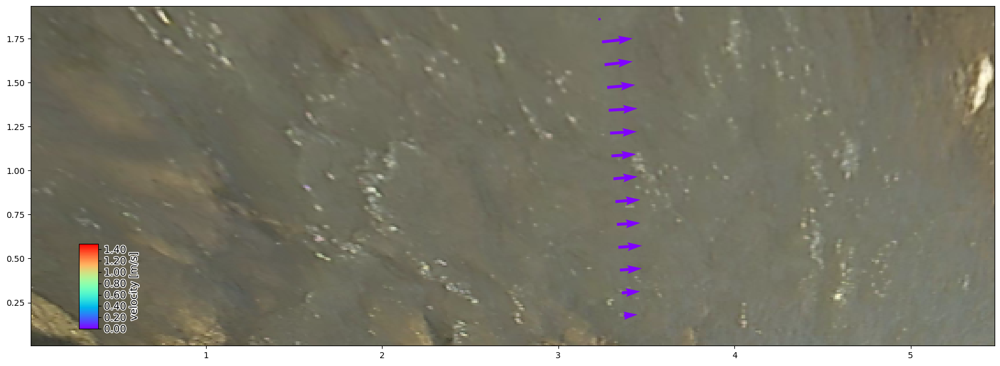

In [47]:
# again plot the projected background
from matplotlib.colors import Normalize
norm = Normalize(vmin=0, vmax=1.5, clip=False)
ds_mean = ds.mean(dim="time", keep_attrs=True)
p = da_rgb.frames.project()[0].frames.plot(mode="local")

# plot velocimetry point results in local projection
ds_points_q.isel(quantile=2).transect.plot(
    ax=p.axes,
    mode="local",
    cmap="rainbow",
    scale=10,
    width=0.003,
    norm=norm,
    add_colorbar=True,
)

ds_points_q2.isel(quantile=2).transect.plot(
    ax=p.axes,
    mode="local",
    cmap="rainbow",
    scale=10,
    width=0.003,
    norm=norm,
    add_colorbar=True,
)
# to ensure streamplot understands the directions correctly, all values must
# be flipped upside down and up-down velocities become down-up velocities.
ds_mean.velocimetry.plot.streamplot(
    ax=p.axes,
    mode="local",
    density=3.,
    minlength=0.05,
    linewidth_scale=2,
    cmap="rainbow",
    norm=norm,
    add_colorbar=True
)

In [161]:
velocity_profile = ds['s2n']

In [162]:
velocity_profile

<xarray.DataArray 's2n' (time: 124, y: 14, x: 40)>
array([[[1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 0.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 0.  , 1.  , ..., 1.  , 1.  , 1.01],
        ...,
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ]],

       [[1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 0.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        ...,
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ]],

       [[1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        ...,
...
        ...,
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ]],

       [[1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        ...,
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ]],

       [[1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 0.  , 1.  , ..., 1.  , 1.  , 1.01],
        ...,
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
        [1.  , 1.  , 1.  , ..., 0.  , 0.  , 1.  ]]], dtype=float32)
Coordinates:
  * time     (time) float64 0.04996 0.09992 0.1499 0.1998 ... 6.095 6.145 6.195
  * y        (y) float64 1.755 1.625 1.495 1.365 ... 0.455 0.325 0.195 0.065
  * x        (x) float64 0.065 0.195 0.325 0.455 ... 4.745 4.875 5.005 5.135
    xp       (y, x) float32 595.7 595.7 595.6 595.6 ... 396.0 396.0 396.1 396.2
    yp       (y, x) float32 929.7 920.2 910.8 901.3 ... 569.7 556.7 543.8 530.9
    xs       (y, x) float64 3.33e+05 3.33e+05 3.33e+05 ... 3.33e+05 3.33e+05
    ys       (y, x) float64 3.061e+06 3.061e+06 ... 3.061e+06 3.061e+06
    lon      (y, x) float64 85.31 85.31 85.31 85.31 ... 85.31 85.31 85.31 85.31
    lat      (y, x) float64 27.66 27.66 27.66 27.66 ... 27.66 27.66 27.66 27.66
Attributes:
    camera_shape:   [1280, 720]
    camera_config:  {\n    "height": 1280,\n    "width": 720,\n    "crs": "PR...
    h_a:            null

In [151]:
s2n = velocity_profile 

(array([ 3369.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0., 66071.]),
 array([0.        , 0.10399999, 0.20799999, 0.31199998, 0.41599998,
        0.51999998, 0.62399995, 0.72799999, 0.83199996, 0.93599999,
        1.03999996]),
 <BarContainer object of 10 artists>)

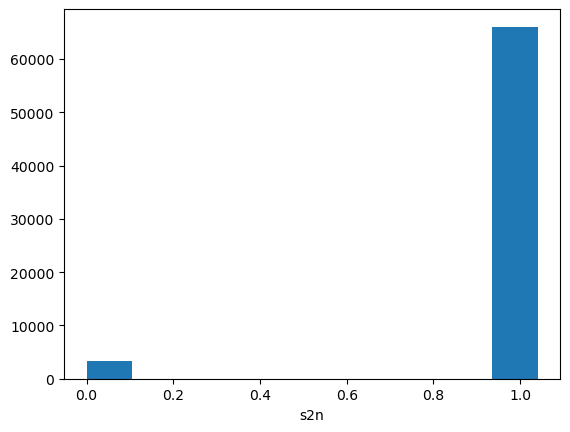

In [154]:
s2n.plot()

In [165]:
ds_points_q.transect.get_river_flow()
print(ds_points_q["river_flow"])
ds_points_q2.transect.get_river_flow()
print(ds_points_q2["river_flow"])

<xarray.DataArray 'river_flow' (quantile: 5)>
array([-0.02036574, -0.16990797, -0.27462627, -0.38893577, -0.54137669])
Coordinates:
  * quantile  (quantile) float64 0.05 0.25 0.5 0.75 0.95
Attributes:
    standard_name:  river_discharge
    long_name:      River Flow
    units:          m3 s-1
<xarray.DataArray 'river_flow' (quantile: 5)>
array([ 0.0054511 , -0.14557729, -0.27355781, -0.41069274, -0.58367761])
Coordinates:
  * quantile  (quantile) float64 0.05 0.25 0.5 0.75 0.95
Attributes:
    standard_name:  river_discharge
    long_name:      River Flow
    units:          m3 s-1
